Name - Omkar Arun Shinde

**********Github link - https://github.com/Omkar-Shinde12**********

**********LinkedIn link - www.linkedin.com/in/omkararunshinde**********

********Intern ID: IN9240411********

**********Step 1.: Importing Neccessary Libraries**********

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

********Step 2.: Reading & Loading Dataset********

In [8]:
# loading data into df
df = pd.read_csv("EV.csv")

**********Step 3.: Sanity Check of the Data**********

In [10]:
# Checking head
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [11]:
# Checking shape of the data
df.shape

(112634, 17)

In [12]:
# Checking info of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [13]:
# Checking column names
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [14]:
# Converting all column name into lower case
df.columns = df.columns.str.lower()
# Removing extra spaces between name of the columns
df.columns = df.columns.str.strip()

In [15]:
# Checking column names
df.columns

Index(['vin (1-10)', 'county', 'city', 'state', 'postal code', 'model year',
       'make', 'model', 'electric vehicle type',
       'clean alternative fuel vehicle (cafv) eligibility', 'electric range',
       'base msrp', 'legislative district', 'dol vehicle id',
       'vehicle location', 'electric utility', '2020 census tract'],
      dtype='object')

In [16]:
# renaming columns name so that it is easy to remember and make query
df.rename(columns = {"vin (1-10)" : "vehicle number", "electric vehicle type" : "ev type",
                     "clean alternative fuel vehicle (cafv) eligibility" : "cafv eligibility",
                    "dol vehicle id" : "vehicle id" }, inplace = True)

In [17]:
# Checking Description of the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
postal code,112634.0,9.815623e+04,2.648733e+03,1.730000e+03,9.805200e+04,9.811900e+04,9.837000e+04,9.970100e+04
model year,112634.0,2.019003e+03,2.892364e+00,1.997000e+03,2.017000e+03,2.020000e+03,2.022000e+03,2.023000e+03
electric range,112634.0,8.781299e+01,1.023342e+02,0.000000e+00,0.000000e+00,3.200000e+01,2.080000e+02,3.370000e+02
base msrp,112634.0,1.793440e+03,1.078375e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.450000e+05
legislative district,112348.0,2.980560e+01,1.470055e+01,1.000000e+00,1.800000e+01,3.400000e+01,4.300000e+01,4.900000e+01
vehicle id,112634.0,1.994567e+08,9.398427e+07,4.777000e+03,1.484142e+08,1.923896e+08,2.191899e+08,4.792548e+08
2020 census tract,112634.0,5.296650e+10,1.699104e+09,1.101001e+09,5.303301e+10,5.303303e+10,5.305307e+10,5.603300e+10


In [18]:
# checking count of null values
df.isnull().sum()

vehicle number            0
county                    0
city                      0
state                     0
postal code               0
model year                0
make                      0
model                    20
ev type                   0
cafv eligibility          0
electric range            0
base msrp                 0
legislative district    286
vehicle id                0
vehicle location         24
electric utility        443
2020 census tract         0
dtype: int64

In [19]:
# checking percentage of count of null values
df.isnull().sum() / df.shape[0] * 100

vehicle number          0.000000
county                  0.000000
city                    0.000000
state                   0.000000
postal code             0.000000
model year              0.000000
make                    0.000000
model                   0.017757
ev type                 0.000000
cafv eligibility        0.000000
electric range          0.000000
base msrp               0.000000
legislative district    0.253920
vehicle id              0.000000
vehicle location        0.021308
electric utility        0.393309
2020 census tract       0.000000
dtype: float64

As you can see there is much less amount of missing values so dropping it is best choice here.
But if you want to have that data also then you have to enter values inplace of missing values

In [21]:
# checking null values count for model column
df['model'].isnull().sum()

20

In [22]:
# missing values treatment for model column
df['model'].unique()

array(['RAV4 PRIME', 'VOLT', 'LEAF', 'BOLT EV', 'FUSION', 'MODEL 3',
       'SOUL', 'Q5 E', 'MODEL X', '500', 'X5', '530E', 'TAYCAN', 'X3',
       'A3', 'SOUL EV', 'C-MAX', 'MODEL S', 'F-150', 'CT6', 'I3',
       'CLARITY', 'MODEL Y', 'NIRO', 'OUTLANDER', 'PACIFICA', 'R1T',
       'KONA ELECTRIC', 'XC40', 'ID.4', 'PRIUS PLUG-IN', 'MUSTANG MACH-E',
       'EQB-CLASS', 'E-GOLF', 'PRIUS PRIME', 'C40', 'SORENTO', 'XC60',
       'CAYENNE', 'WRANGLER', 'COUNTRYMAN', 'S60', 'EV6',
       'FORTWO ELECTRIC DRIVE', 'GRAND CHEROKEE', '330E', 'CROSSTREK',
       'IONIQ 5', 'IONIQ', 'E-TRON', 'ROADSTER', 'KONA', 'XC90', 'SPARK',
       'PS2', 'A7', 'HARDTOP', 'ESCAPE', 'LUCID AIR', 'E-TRON SPORTBACK',
       'Q5', 'RAV4', 'AVIATOR', 'E-TRON GT', 'EDV', 'IX', 'FORTWO',
       'I-PACE', 'SANTA FE', 'B-CLASS', 'KARMA', 'I4', 'OPTIMA',
       'GLC-CLASS', 'Q4', 'SONATA', 'EQ FORTWO', 'FOCUS',
       'RANGE ROVER SPORT', 'TRANSIT', 'PANAMERA', 'I8', 'BOLT EUV',
       'CORSAIR', 'ELR', 'GLE-CLASS', 'V60

In [23]:
# replace remaining missing values by not known 
df['model'].fillna('NOT KNOWN', inplace = True) # since all values in this column are in upper case

In [24]:
# checking null values count for model column
df['model'].isnull().sum()

0

In [25]:
# checking null values count for legislative district column
df['legislative district'].isnull().sum()

286

In [26]:
# missing values treatment for legislative district column
df['legislative district'].unique()

array([nan, 15., 39., 38.,  1., 21., 10., 40., 22., 13., 20.,  2., 32.,
        7., 46., 30., 35., 44., 14.,  9.,  3., 23., 24.,  5., 33., 45.,
       19., 27., 26., 25., 43., 17.,  6., 41., 37., 34., 31., 12., 28.,
       48., 49.,  4., 29., 36., 42.,  8., 18., 11., 16., 47.])

In [27]:
# checking type of legislative district column
df['legislative district'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 112634 entries, 0 to 112633
Series name: legislative district
Non-Null Count   Dtype  
--------------   -----  
112348 non-null  float64
dtypes: float64(1)
memory usage: 880.1 KB


In [28]:
# removing dot from values and making column type as int
df['legislative district'].fillna(0.0, inplace = True) 
df['legislative district'] = df['legislative district'].astype(int)

In [29]:
# checking null values count for legislative district column
df['legislative district'].isnull().sum()

0

In [30]:
# checking null values count for vehicle location column
df['vehicle location'].isnull().sum()

24

In [31]:
# missing values treatment for vehicle location column
df['vehicle location'].unique()

array(['POINT (-81.80023 24.5545)', 'POINT (-114.57245 35.16815)',
       'POINT (-120.50721 46.60448)', 'POINT (-121.7515 48.53892)',
       'POINT (-122.20596 47.97659)', 'POINT (-122.18384 47.8031)',
       'POINT (-122.23019 47.94949)', 'POINT (-122.29196 47.89908)',
       'POINT (-122.35803 47.9796)', 'POINT (-122.61214 48.51748)',
       'POINT (-122.75379 47.06316)', 'POINT (-119.2771 47.13196)',
       'POINT (-89.79939 38.49028)', 'POINT (-123.08743 46.82175)',
       'POINT (-122.33029 48.46846)', nan, 'POINT (-122.19388 48.15353)',
       'POINT (-122.27734 47.83785)', 'POINT (-73.84643 43.1284)',
       'POINT (-122.31768 47.87166)', 'POINT (-117.54392 47.77676)',
       'POINT (-122.92333 47.03779)', 'POINT (-122.27981 47.85727)',
       'POINT (-122.3026 47.72656)', 'POINT (-122.23035 47.3074)',
       'POINT (-122.31765 47.70013)', 'POINT (-122.37689 47.81116)',
       'POINT (-122.40618 48.0399)', 'POINT (-122.82324 47.04437)',
       'POINT (-122.89166 47.03956)', 'PO

In [32]:
# replace remaining missing values by point (unreachable)
df['vehicle location'].fillna('POINT (UNREACHABLE)', inplace = True) # since all values in this column are in upper case

In [33]:
# checking null values count for vehicle location column
df['vehicle location'].isnull().sum()

0

In [34]:
# checking null values count for electric utility column
df['electric utility'].isnull().sum()

443

In [35]:
# missing values treatment for electric utility column
df['electric utility'].unique()

array([nan, 'PACIFICORP', 'PUGET SOUND ENERGY INC',
       'PUD NO 2 OF GRANT COUNTY',
       'PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA)',
       'CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA)', 'AVISTA CORP',
       'MODERN ELECTRIC WATER COMPANY',
       'BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF COWLITZ COUNTY',
       'BONNEVILLE POWER ADMINISTRATION||CITY OF TACOMA - (WA)||PENINSULA LIGHT COMPANY',
       'BONNEVILLE POWER ADMINISTRATION||CITY OF ELLENSBURG - (WA)',
       'BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF GRAYS HARBOR COUNTY',
       'BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF CLARK COUNTY - (WA)',
       'BONNEVILLE POWER ADMINISTRATION||AVISTA CORP||INLAND POWER & LIGHT COMPANY',
       'BONNEVILLE POWER ADMINISTRATION||PUD 1 OF SNOHOMISH COUNTY',
       'PUD NO 1 OF CHELAN COUNTY',
       'BONNEVILLE POWER ADMINISTRATION||VERA IRRIGATION DISTRICT #15',
       'BONNEVILLE POWER ADMINISTRATION||CITY OF TACOMA - (WA)||ELMHURST MUTUAL POWER & LIGHT CO|PENINSULA

In [36]:
# replace remaining missing values by not known 
df['electric utility'].fillna('NOT KNOWN', inplace = True) # since all values in this column are in upper case

In [37]:
# checking null values count for electric utility column
df['electric utility'].isnull().sum()

0

In [38]:
# checking null values count
df.isnull().sum()

vehicle number          0
county                  0
city                    0
state                   0
postal code             0
model year              0
make                    0
model                   0
ev type                 0
cafv eligibility        0
electric range          0
base msrp               0
legislative district    0
vehicle id              0
vehicle location        0
electric utility        0
2020 census tract       0
dtype: int64

********Univariate Analysis********

************Non - Visual Analysis for Numerical columns************

In [41]:
# storing all numerical columns into df_num variable
df_num = df.select_dtypes(include = "number")

In [42]:
# Using for loop calculating aggregate values like min, max, mean, std, etc... for numerical columns
for column in df_num:
    print("*" * 15, column, "*" * 15)
    stastics = df_num[column].agg(['min', 'max', 'mean', 'median', 'std', 'var', 'skew', 'kurt'])
    range_val = df_num[column].max() - df_num[column].min()
    stastics['range'] = range_val
    print(stastics)
    print()

*************** postal code ***************
min       1.730000e+03
max       9.970100e+04
mean      9.815623e+04
median    9.811900e+04
std       2.648733e+03
var       7.015787e+06
skew     -2.795529e+01
kurt      8.208748e+02
range     9.797100e+04
Name: postal code, dtype: float64

*************** model year ***************
min       1997.000000
max       2023.000000
mean      2019.003365
median    2020.000000
std          2.892364
var          8.365770
skew        -0.817579
kurt        -0.001160
range       26.000000
Name: model year, dtype: float64

*************** electric range ***************
min           0.000000
max         337.000000
mean         87.812987
median       32.000000
std         102.334216
var       10472.291769
skew          0.817103
kurt         -0.876312
range       337.000000
Name: electric range, dtype: float64

*************** base msrp ***************
min       0.000000e+00
max       8.450000e+05
mean      1.793440e+03
median    0.000000e+00
std       1.0

************Non - Visual Analysis for Categorical columns************

In [44]:
# storing all categorical columns into df_cat variable
df_cat = df.select_dtypes(include = "object")

In [45]:
# Using for loop calculating different values like count, unique, nunique, mode, etc... for categorical columns
for column in df_cat:
    print("*" * 15, column, "*" * 15)
    print(df_cat[column].agg(['count', 'nunique', 'unique']))
    print('\nValue Counts: \n', df_cat[column].value_counts())
    mode_val = df_cat[column].mode()[0]
    mode_count = df_cat[column].value_counts().max()
    print(f"\nMode: {mode_val} (Appears {mode_count} times)")
    print('\nPercentage of Each Value: \n', df_cat[column].value_counts(normalize=True) * 100)
    print()

*************** vehicle number ***************
count                                                 112634
nunique                                                 7548
unique     [JTMEB3FV6N, 1G1RD6E45D, JN1AZ0CP8B, 1G1FW6S08...
Name: vehicle number, dtype: object

Value Counts: 
 vehicle number
5YJYGDEE9M    472
5YJYGDEE0M    465
5YJYGDEE8M    448
5YJYGDEE7M    448
5YJYGDEE2M    437
             ... 
WA1LAAGE9M      1
5UXKT0C50H      1
5YJYGAED3M      1
WDC0G5DBXL      1
YV4ED3GM0P      1
Name: count, Length: 7548, dtype: int64

Mode: 5YJYGDEE9M (Appears 472 times)

Percentage of Each Value: 
 vehicle number
5YJYGDEE9M    0.419056
5YJYGDEE0M    0.412842
5YJYGDEE8M    0.397748
5YJYGDEE7M    0.397748
5YJYGDEE2M    0.387982
                ...   
WA1LAAGE9M    0.000888
5UXKT0C50H    0.000888
5YJYGAED3M    0.000888
WDC0G5DBXL    0.000888
YV4ED3GM0P    0.000888
Name: proportion, Length: 7548, dtype: float64

*************** county ***************
count                                     

************Visual Analysis for Numerical columns using Bar Plot************

In [47]:
# storing all numerical columns into df_num variable
df_num = df.select_dtypes(include = "number")
df_num = df_num.drop('postal code', axis = 1)
df_num = df_num.drop('vehicle id', axis = 1)
df_num = df_num.drop('2020 census tract', axis = 1)

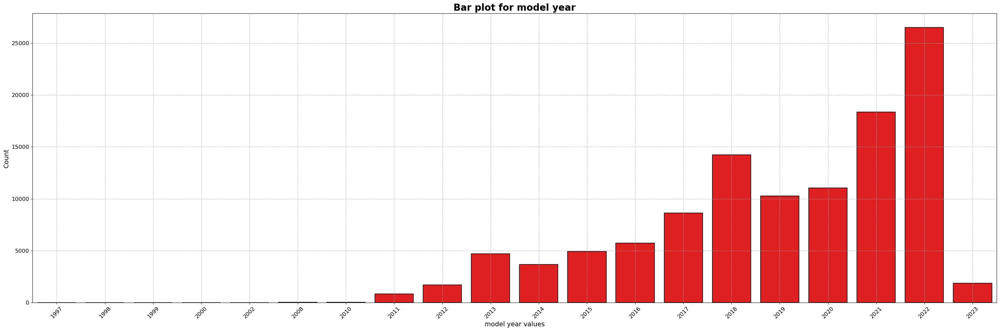

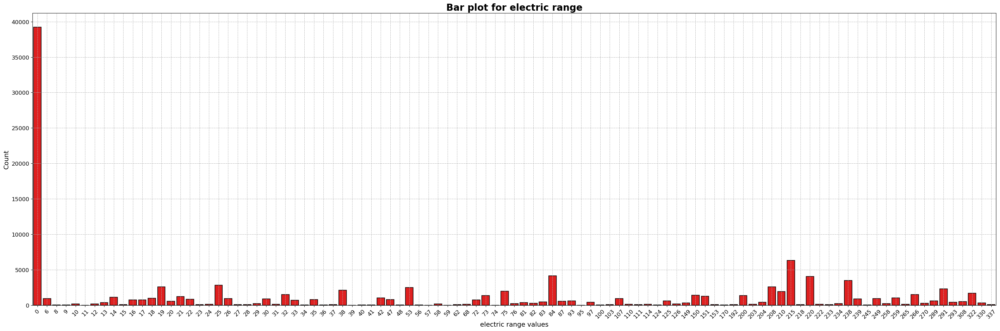

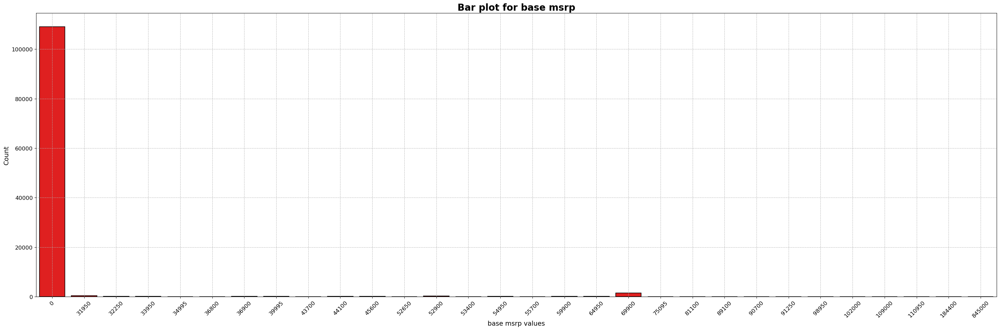

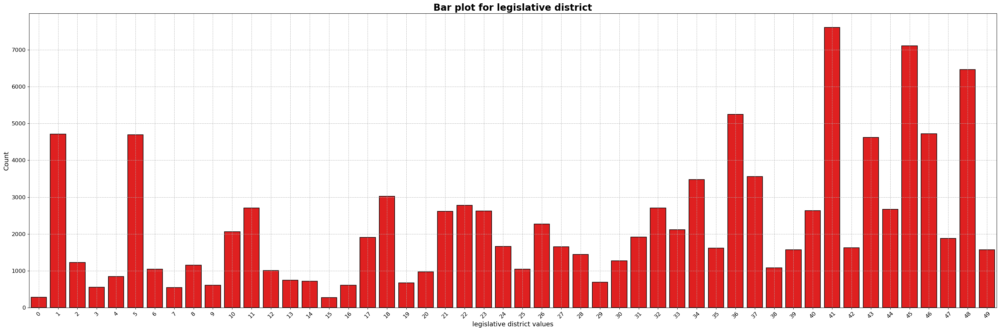

In [48]:
# using for loop for iterations through numerical columns
for column in df_num:
    plt.figure(figsize=(30, 10))
    
    # Creating a bar plot of value counts for numerical columns
    value_counts = df_num[column].value_counts().sort_index()  # Grouping by unique values
    
    sns.barplot(x=value_counts.index, y=value_counts.values, color='red', edgecolor='black', linewidth=1.2)
    
    # Adding a title, x and y labels
    plt.title(f'Bar plot for {column}', fontsize=20, fontweight='bold', color='black')
    plt.xlabel(f'{column} values', fontsize=14)
    plt.ylabel('Count', fontsize=14)
    
    # Adding gridlines for better visualization
    plt.grid(True, which='both', linestyle='--', linewidth=0.7)
    
    # Setting x and y ticks for better control over values
    plt.xticks(fontsize=12, rotation=45)  # Rotate x labels if necessary
    plt.yticks(fontsize=12)
    
    # Adding a tighter layout to avoid overlap
    plt.tight_layout()
    
    # Display the plot
    plt.show()

In [49]:
# Storing specific columns into df_num_rem variable
df_num_rem = df[['postal code', '2020 census tract']]

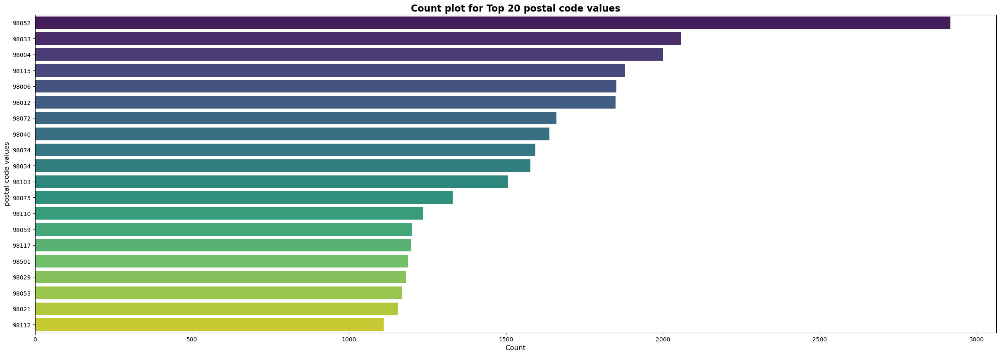

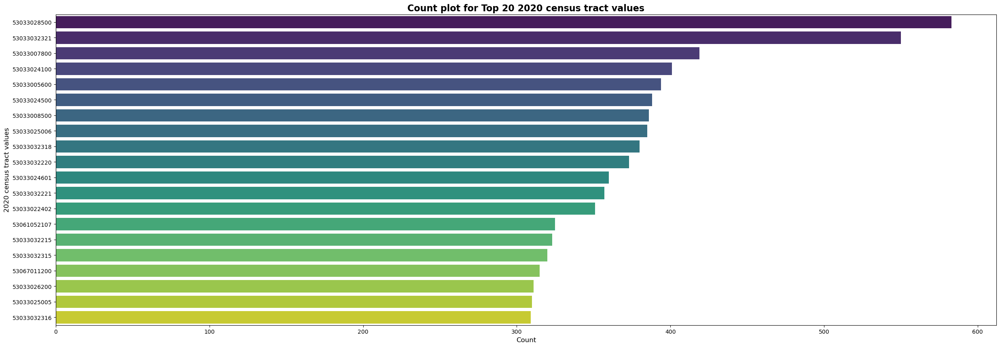

In [50]:
# Loop through each categorical column in df_num_rem
for column in df_num_rem.columns:
    plt.figure(figsize=(30, 10))
    
    # Limit to top 20 most frequent categories
    top_categories = df[column].value_counts().nlargest(20)
    
    # Create a count plot for the current categorical column
    sns.countplot(y=df[column], order=top_categories.index, palette='viridis')

    # Add title and labels
    plt.title(f'Count plot for Top 20 {column} values', fontsize=16, fontweight='bold')
    plt.xlabel('Count', fontsize=12)
    plt.ylabel(f'{column} values', fontsize=12)

    # Display the plot
    plt.show()

************Visual Analysis for Categorical columns using count Plot************

In [52]:
# storing all categorical columns into df_cat variable
df_cat = df.select_dtypes(include = "object")

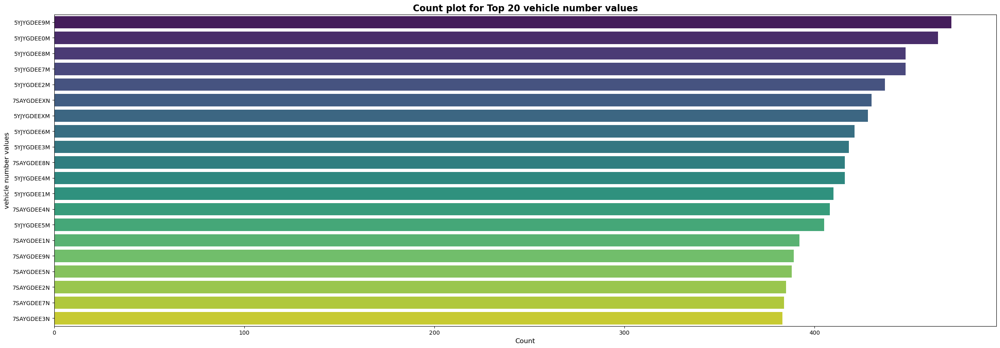

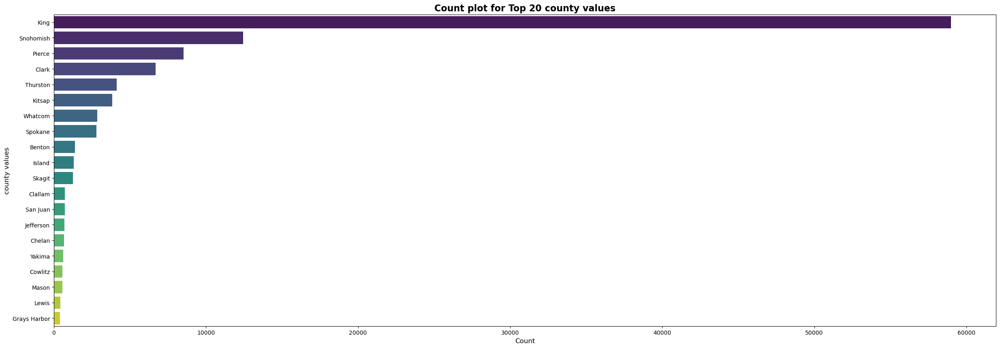

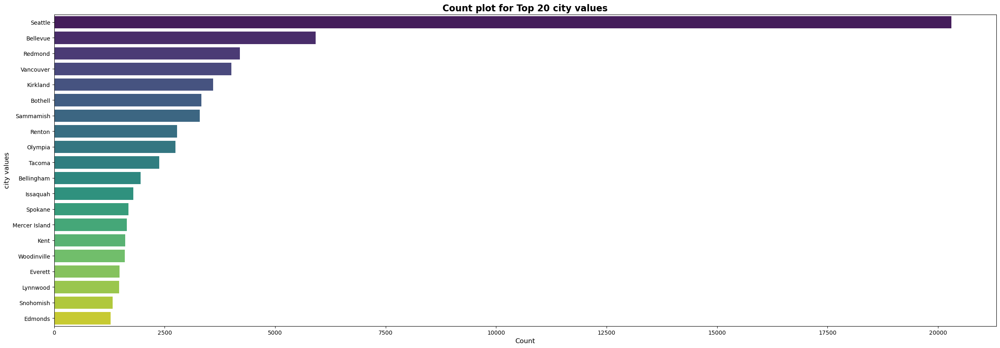

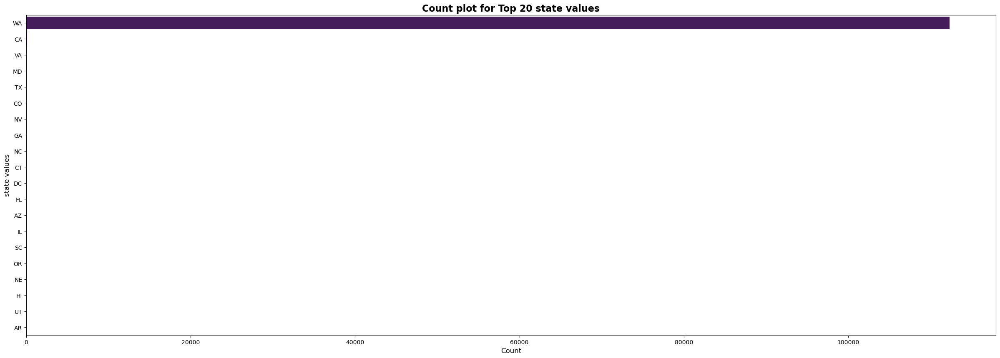

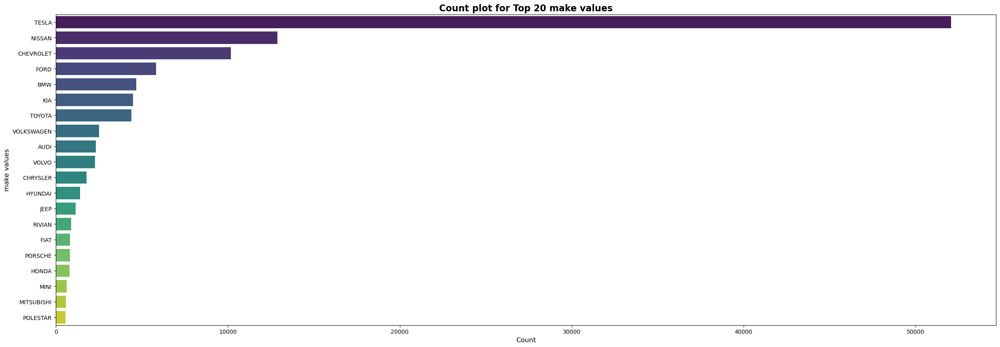

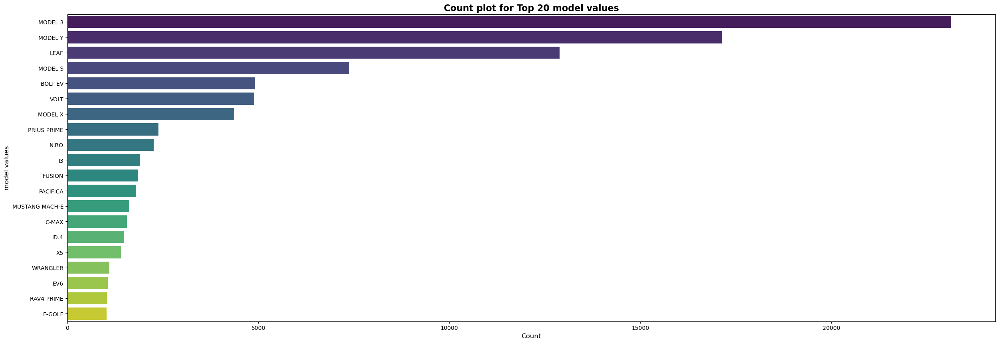

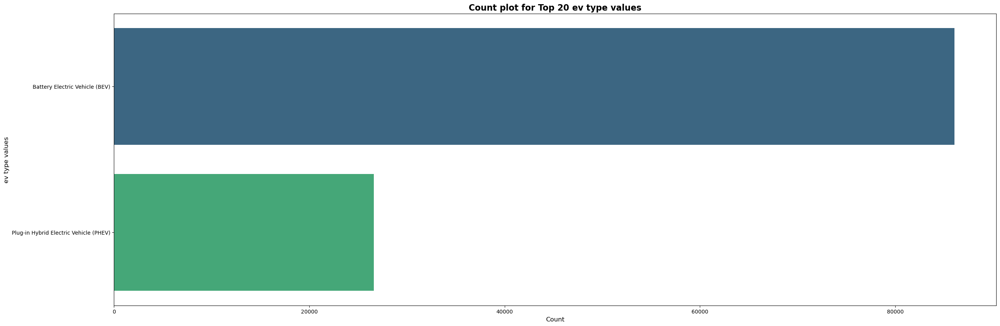

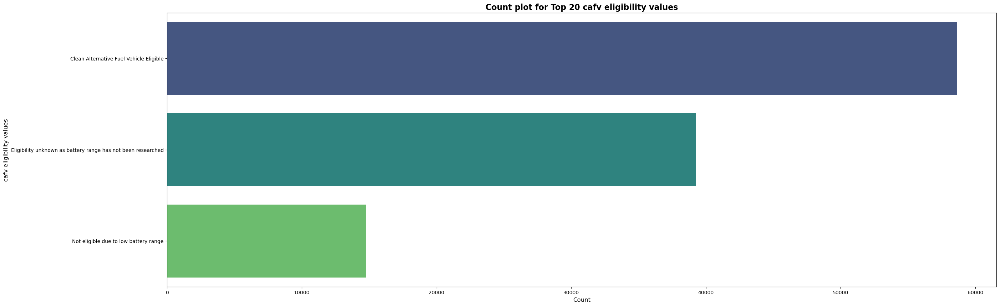

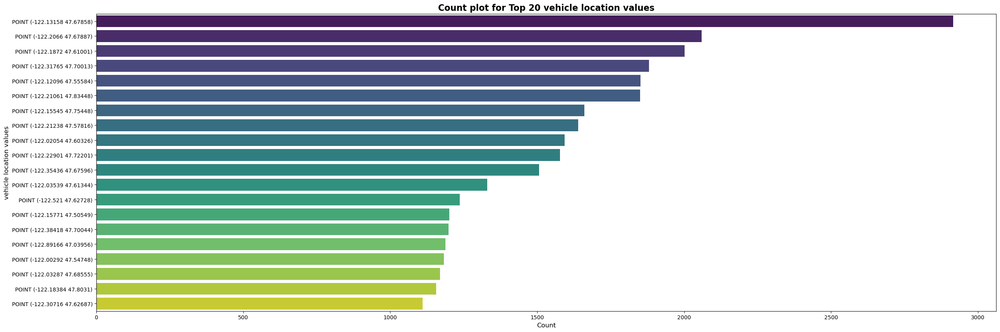

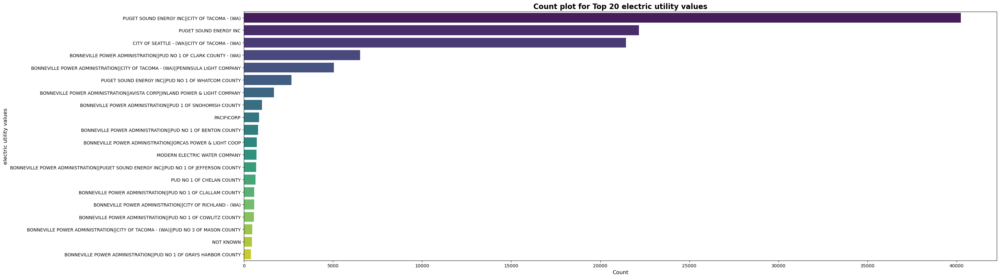

In [53]:
# Loop through each categorical column in df_cat
for column in df_cat.columns:
    plt.figure(figsize=(30, 10))
    
    # Limit to top 20 most frequent categories
    top_categories = df[column].value_counts().nlargest(20)
    
    # Create a count plot for the current categorical column
    sns.countplot(y=df[column], order=top_categories.index, palette='viridis')

    # Add title and labels
    plt.title(f'Count plot for Top 20 {column} values', fontsize=16, fontweight='bold')
    plt.xlabel('Count', fontsize=12)
    plt.ylabel(f'{column} values', fontsize=12)

    # Display the plot
    plt.show()

******Bivariate Analysis******

In [55]:
# Storing numerical and categorical columns
df_num = df.select_dtypes(include='number')  # Numerical columns
df_cat = df.select_dtypes(include='object')   # Categorical columns

******Numerical V/s Numerical******

In [57]:
# showing using corr
df_num = df.select_dtypes(include = "number")
corr_mat = df_num.corr()
corr_mat

,postal code,model year,electric range,base msrp,legislative district,vehicle id,2020 census tract
postal code,1.000000,-0.004485,0.000385,0.001151,0.029071,0.003365,0.501170
model year,-0.004485,1.000000,-0.288433,-0.229130,0.010503,-0.068295,0.000714
electric range,0.000385,-0.288433,1.000000,0.085025,0.024408,0.009682,0.000722
base msrp,0.001151,-0.229130,0.085025,1.000000,0.012552,0.000504,0.000979
legislative district,0.029071,0.010503,0.024408,0.012552,1.000000,-0.001228,0.085622
vehicle id,0.003365,-0.068295,0.009682,0.000504,-0.001228,1.000000,0.002754
2020 census tract,0.501170,0.000714,0.000722,0.000979,0.085622,0.002754,1.000000


In [58]:
# Checking Columns
df_num.columns

Index(['postal code', 'model year', 'electric range', 'base msrp',
       'legislative district', 'vehicle id', '2020 census tract'],
      dtype='object')

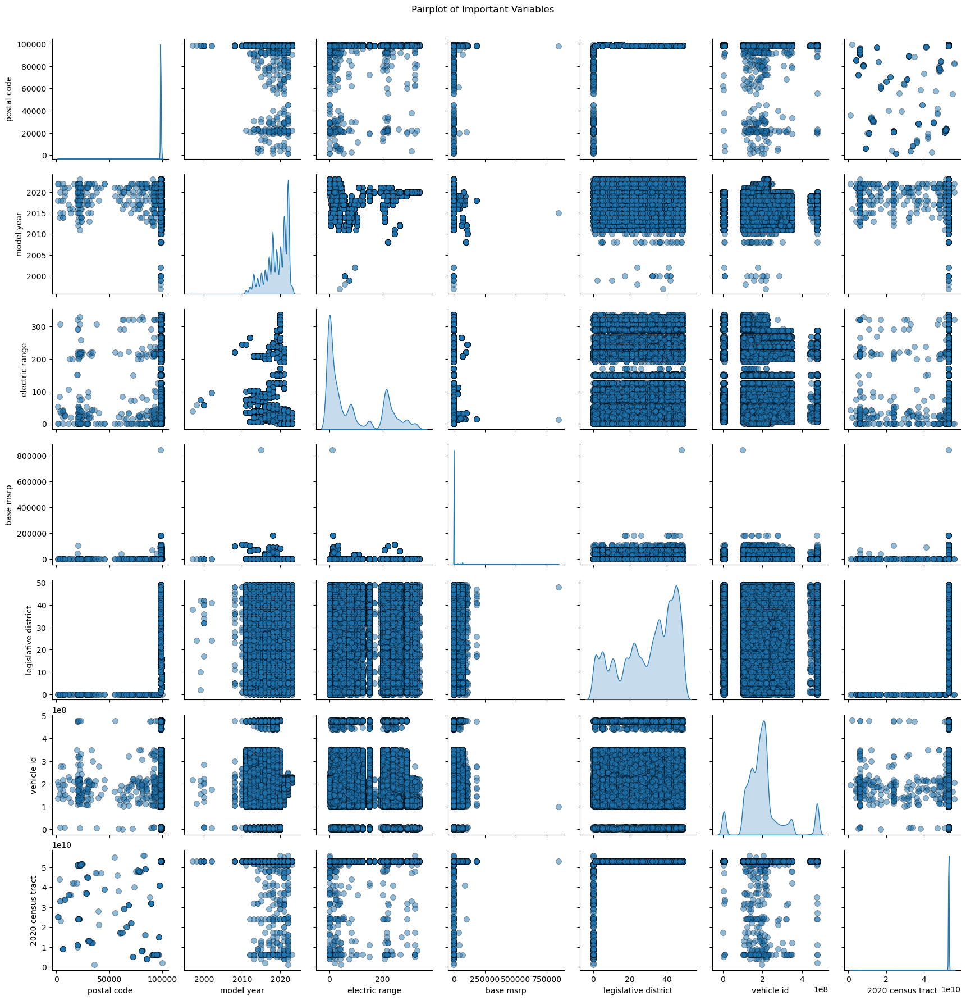

In [59]:
# Pairplot with additional details
sns.pairplot(df_num, vars=['postal code', 'model year', 'electric range', 'base msrp',
                       'legislative district', 'vehicle id', '2020 census tract'], 
             diag_kind='kde',
             plot_kws={'alpha':0.5, 's':50, 'edgecolor':'k'},
             palette='coolwarm')

plt.suptitle('Pairplot of Important Variables', y=1.02) # Add title
plt.show()

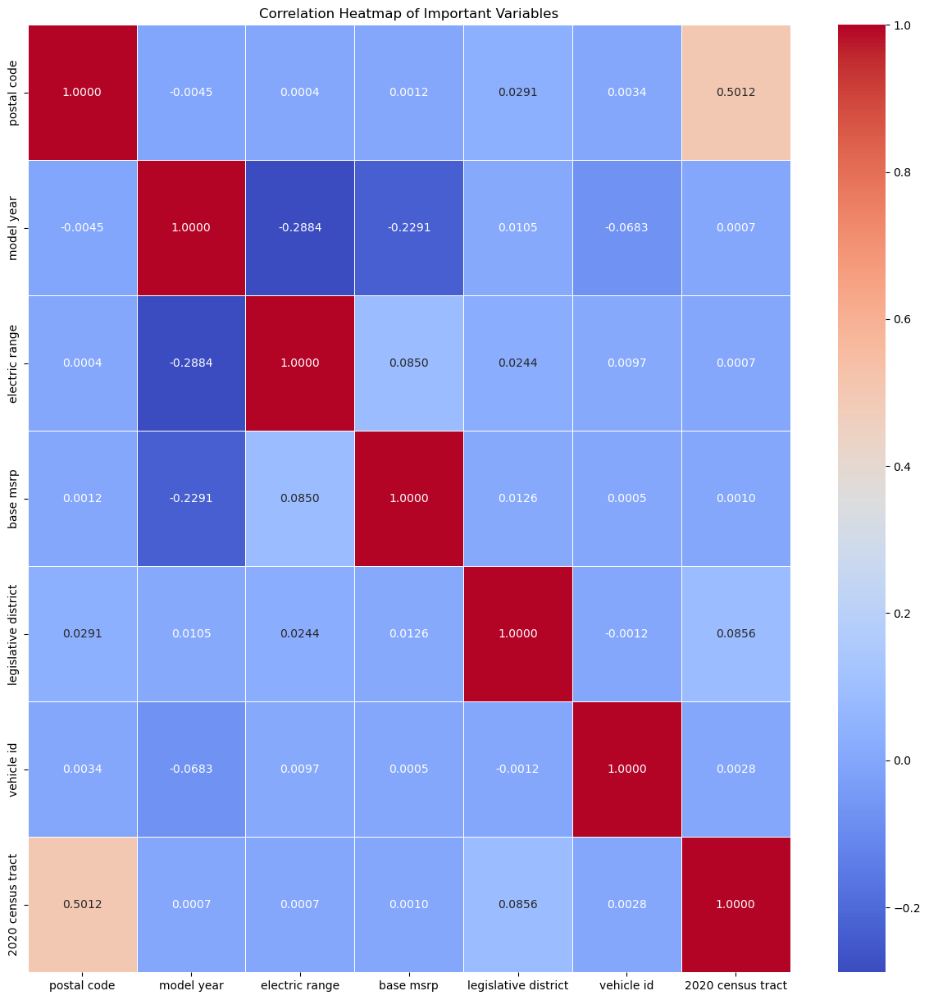

In [60]:
# Plot heatmap
df_corr = df_num[['postal code', 'model year', 'electric range', 'base msrp',
       'legislative district', 'vehicle id', '2020 census tract']].corr()
plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', fmt='.4f', linewidths=0.5)
plt.title('Correlation Heatmap of Important Variables')
plt.show()

******Numerical V/s Categorical******

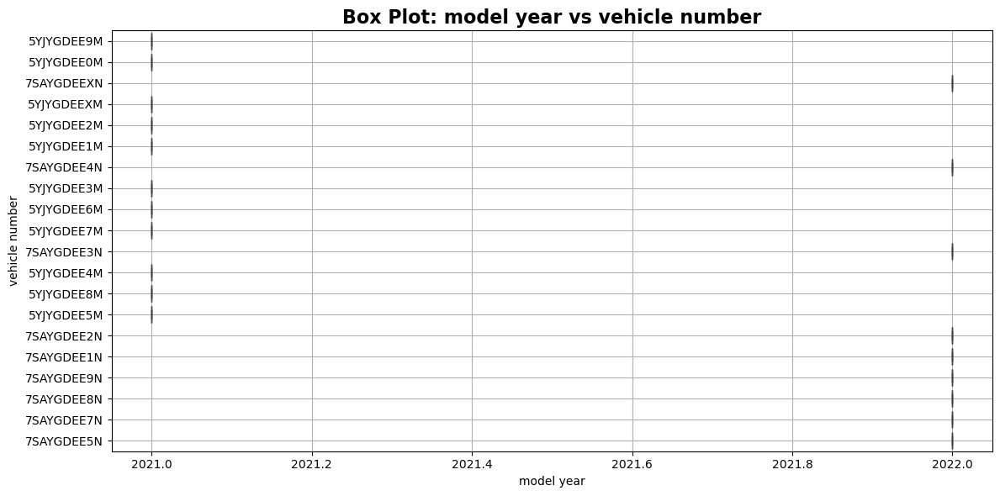

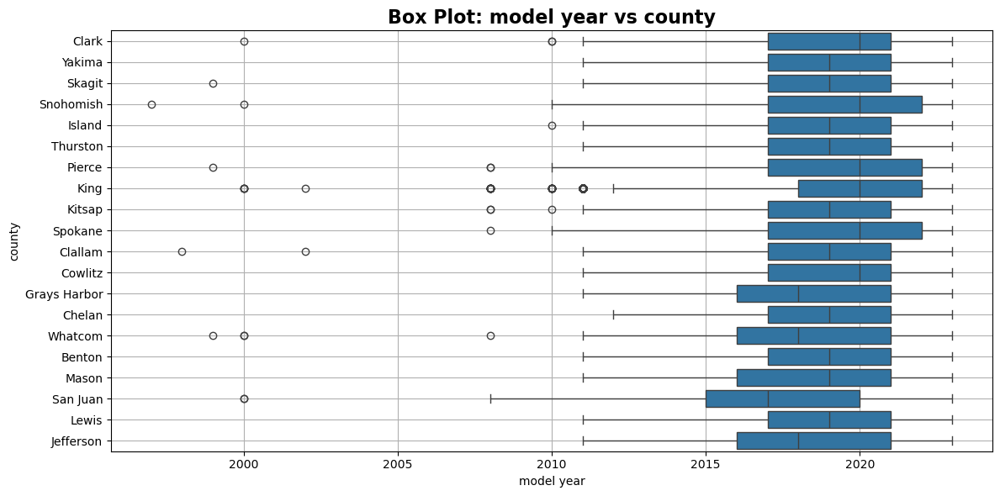

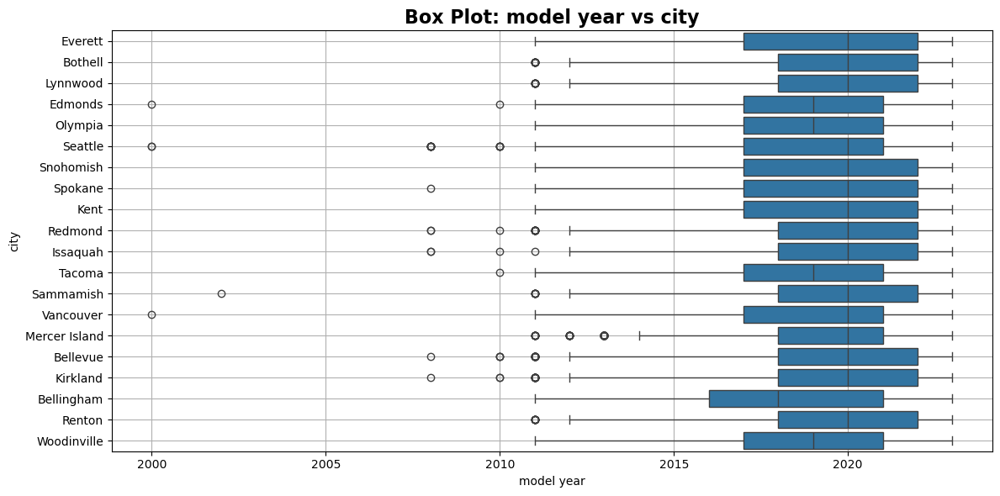

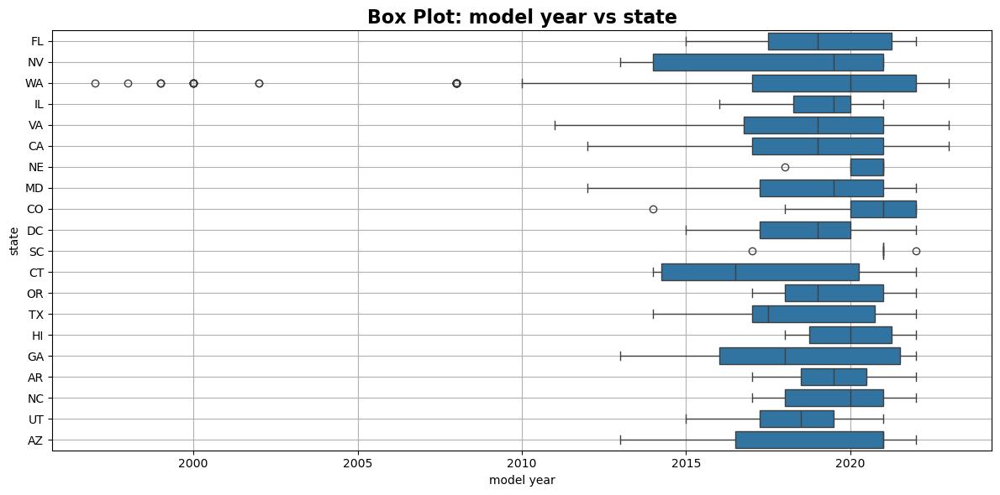

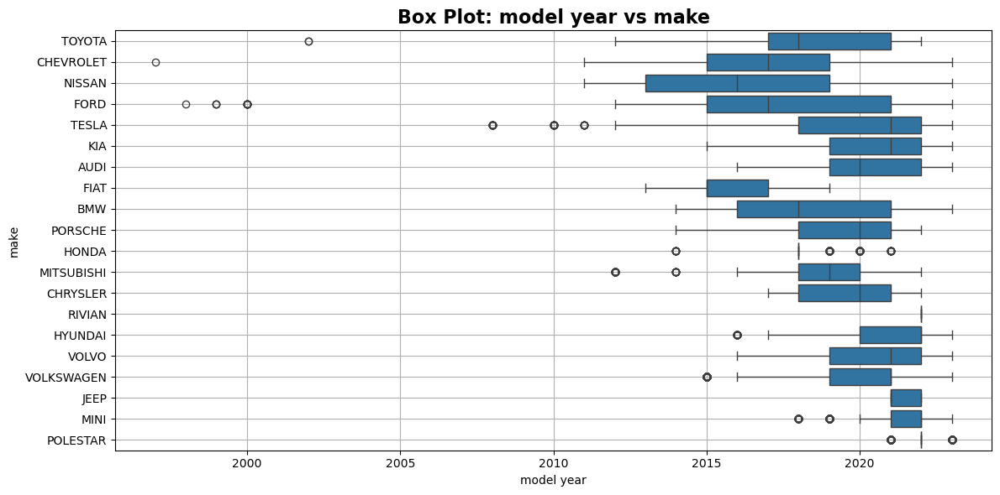

...

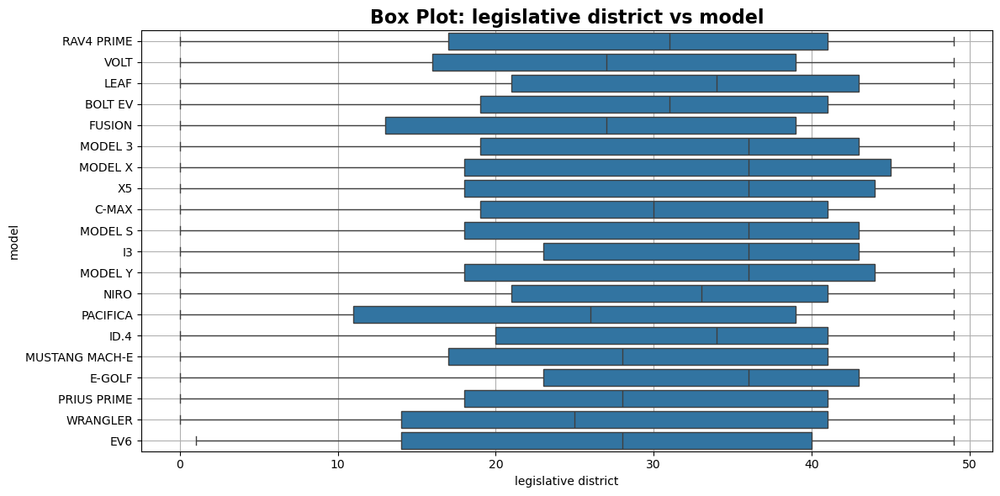

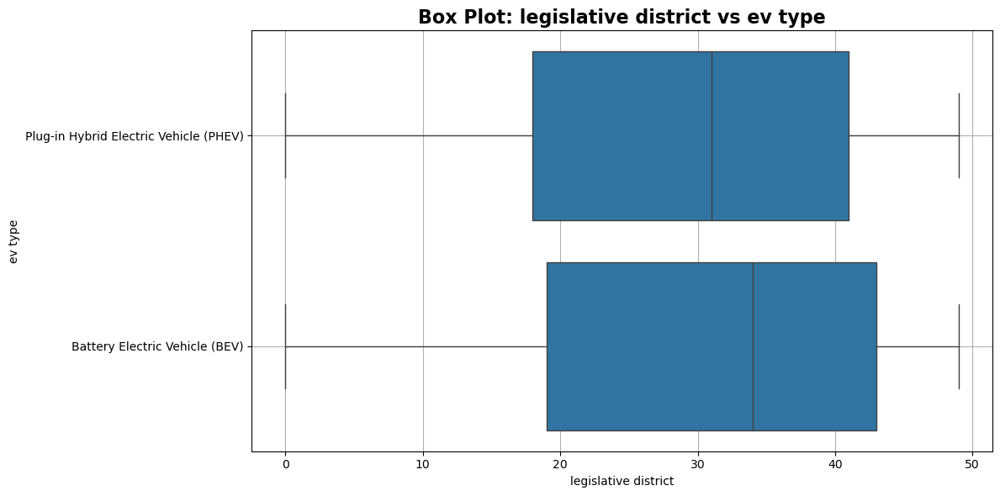

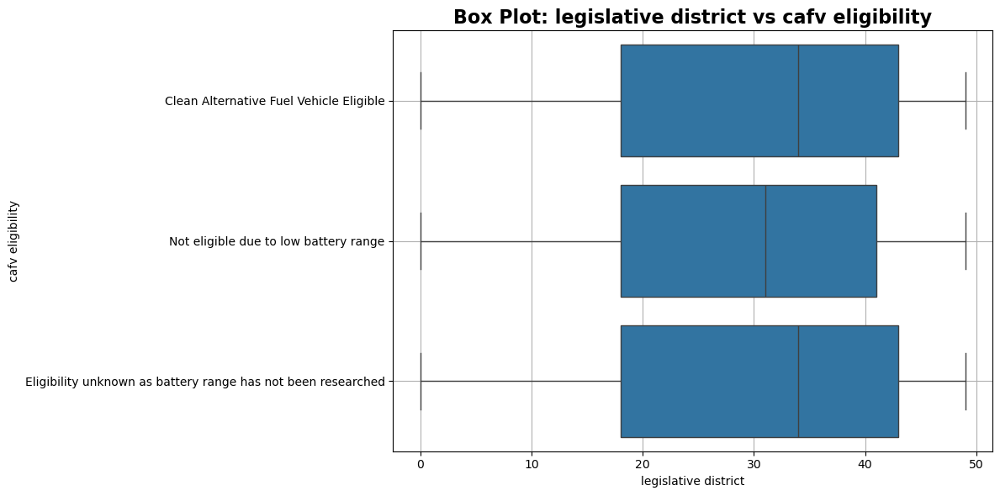

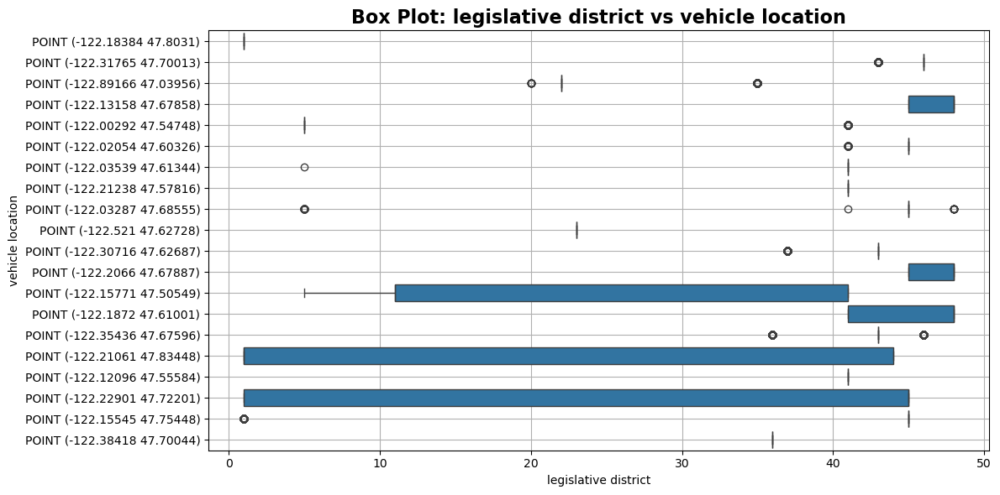

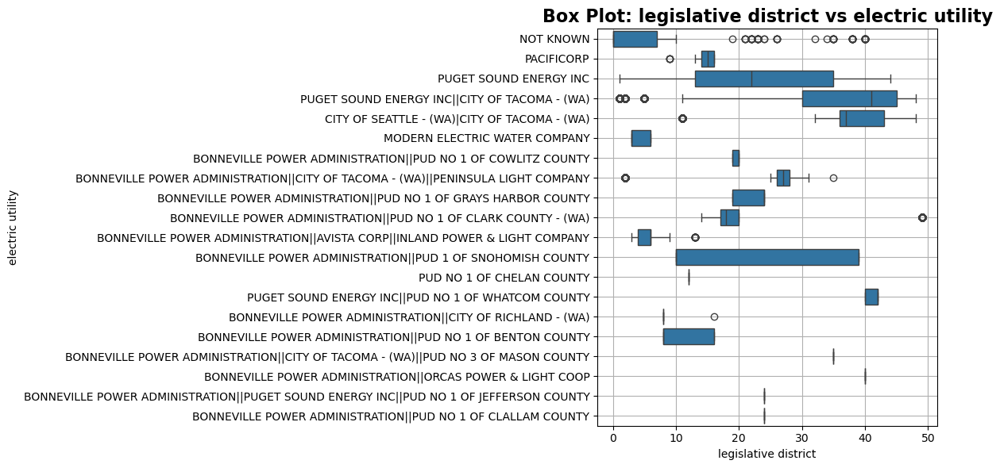

In [62]:
# numericals columns
df_num = df.select_dtypes(include='number')  # Numerical columns
# Drop unnecessary columns from df_num
df_num = df_num.drop(['postal code', 'vehicle id', '2020 census tract'], axis=1)

# Numerical vs. Categorical Analysis
for num_col in df_num.columns:
    for cat_col in df_cat.columns:
        # Get top 20 most frequent categories
        top_categories = df[cat_col].value_counts().nlargest(20).index.tolist()
        
        # Filter the DataFrame to include only top categories
        filtered_df = df[df[cat_col].isin(top_categories)]
        
        plt.figure(figsize=(12, 6))  # Adjust figure size to a reasonable amount
        sns.boxplot(data=filtered_df, x=num_col, y=cat_col)
        
        # Add title and labels
        plt.title(f'Box Plot: {num_col} vs {cat_col}', fontsize=16, fontweight='bold')
        plt.xlabel(num_col)
        plt.ylabel(cat_col)
        plt.grid(True)
        
        # Display the plot
        plt.tight_layout()
        plt.show()

******Categorical V/s Categorical******

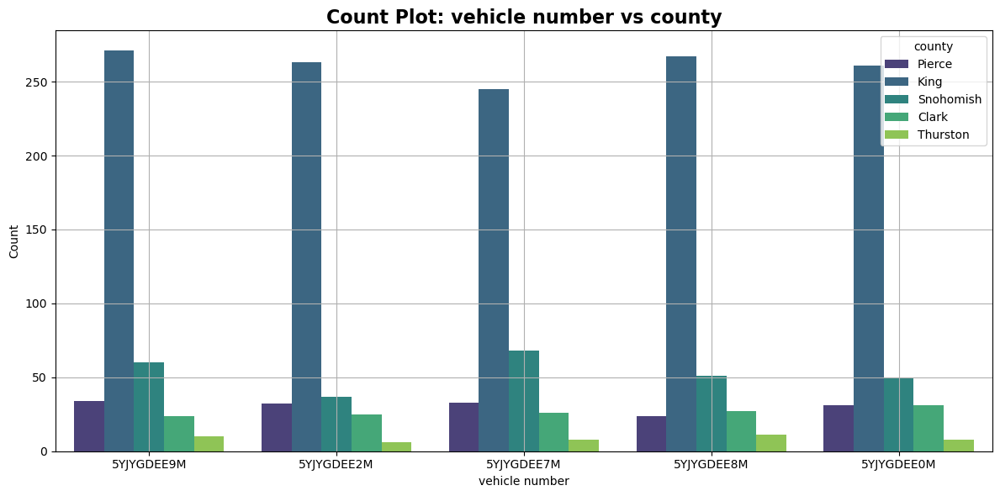

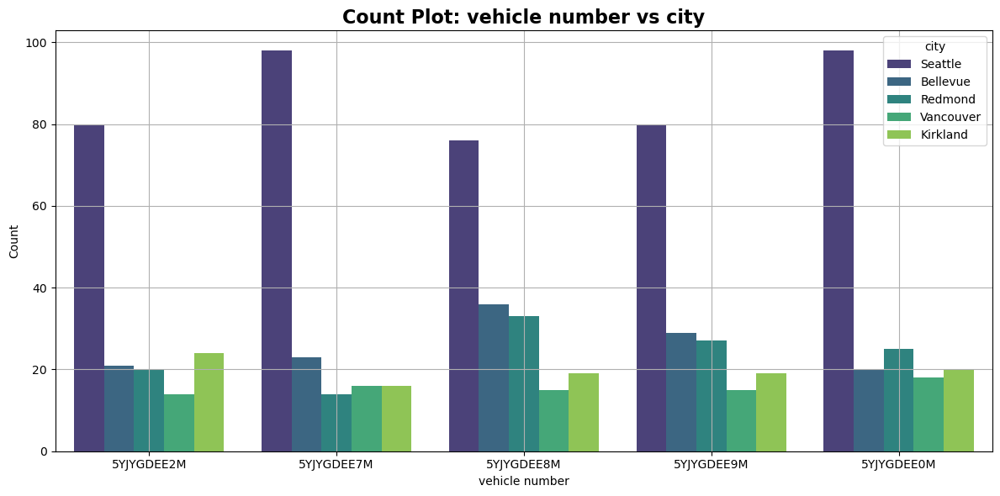

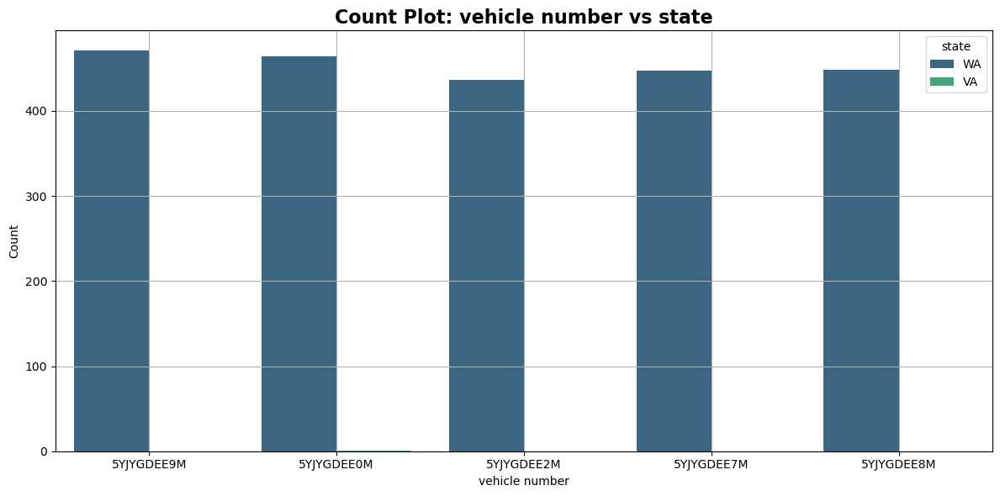

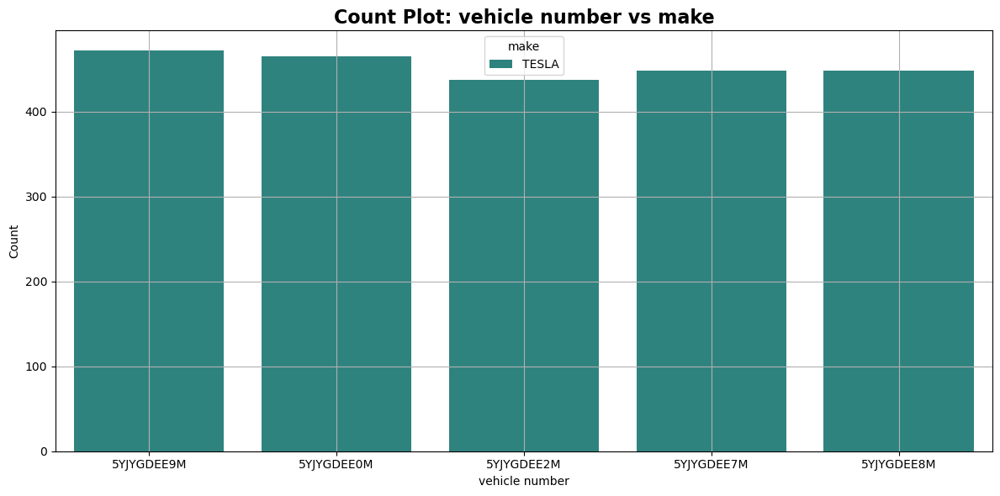

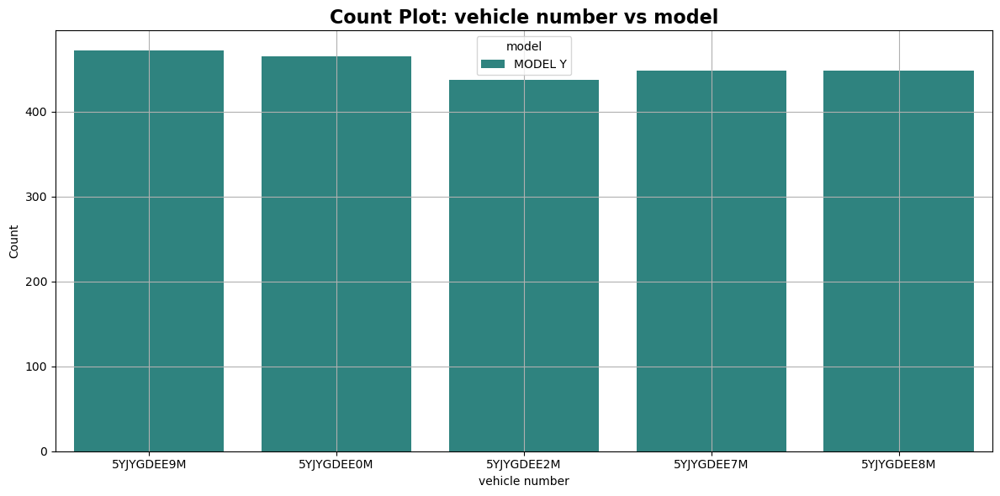

...

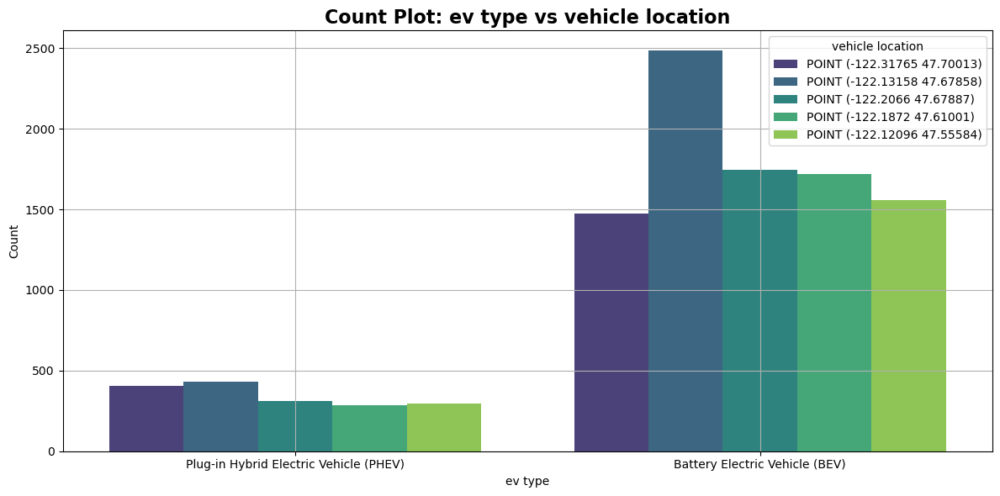

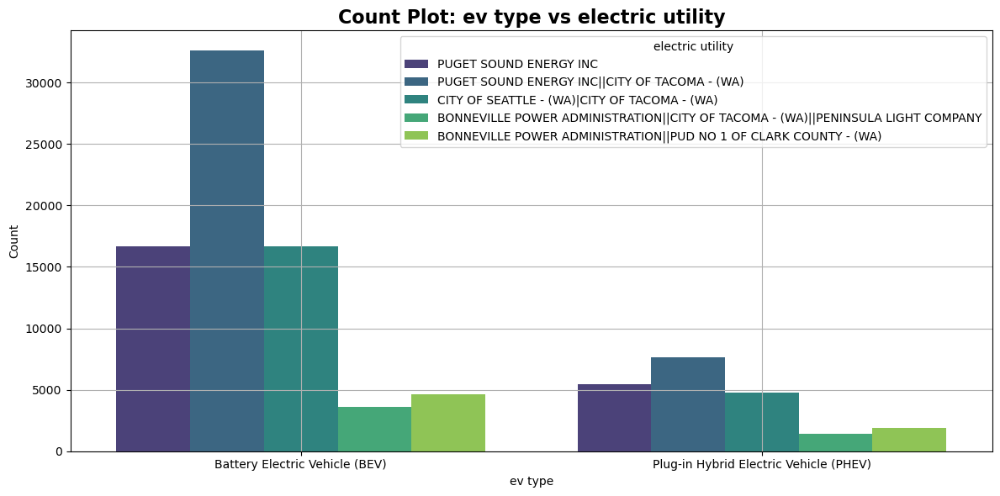

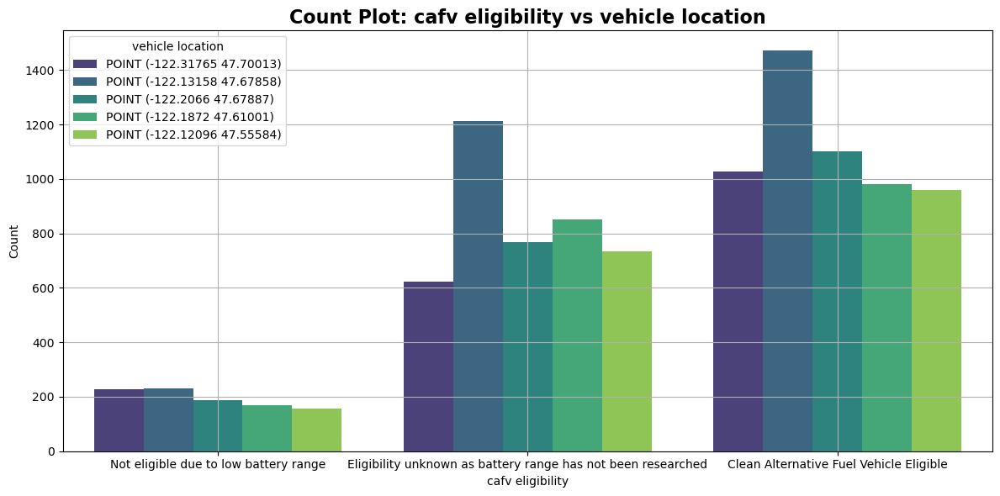

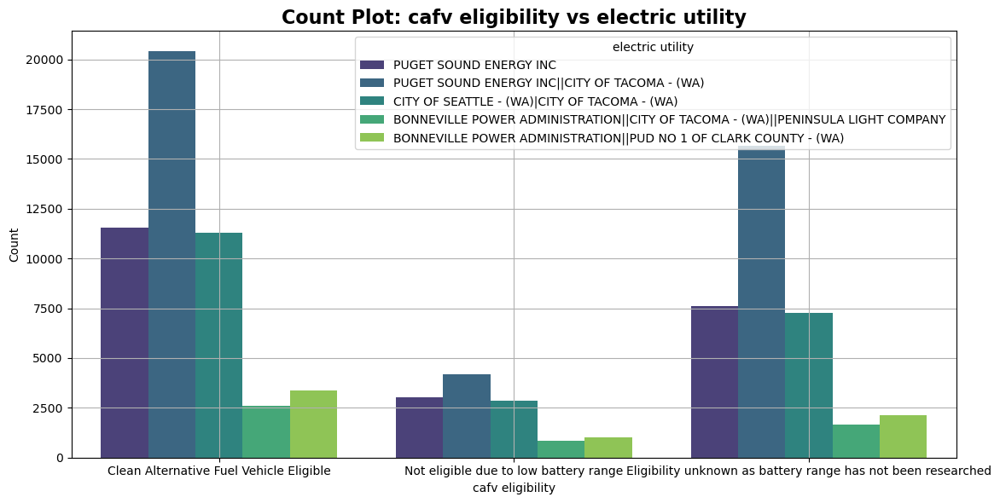

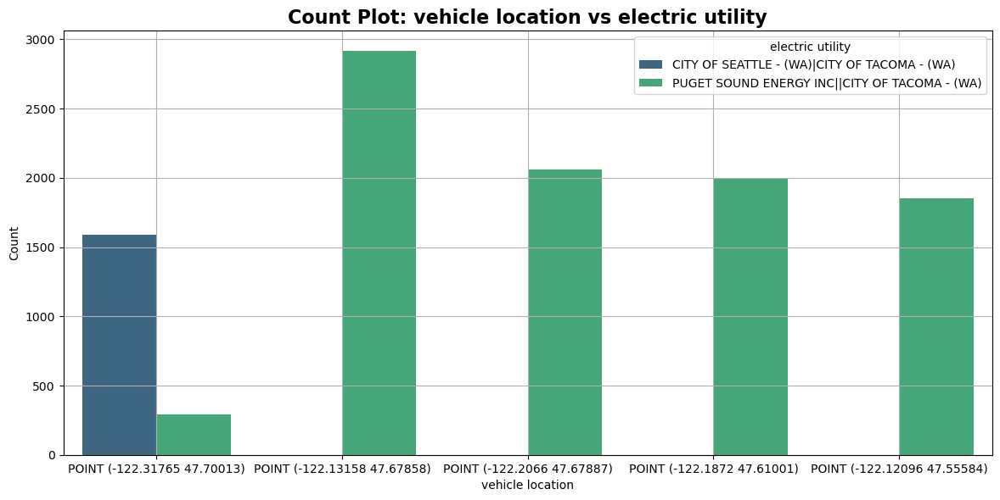

In [64]:
# Categorical vs. Categorical Analysis
for i in range(len(df_cat.columns)):
    for j in range(i + 1, len(df_cat.columns)):
        # Get top 5 most frequent categories for both categorical columns
        top_categories_x = df[df_cat.columns[i]].value_counts().nlargest(5).index.tolist()
        top_categories_y = df[df_cat.columns[j]].value_counts().nlargest(5).index.tolist()
        
        # Filter the DataFrame to include only top categories for both columns
        filtered_df = df[(df[df_cat.columns[i]].isin(top_categories_x)) & 
                         (df[df_cat.columns[j]].isin(top_categories_y))]
        
        plt.figure(figsize=(12, 6))  # Adjust figure size as needed
        
        # Create a count plot for the filtered DataFrame
        sns.countplot(data=filtered_df, x=df_cat.columns[i], hue=df_cat.columns[j], palette='viridis')
        
        # Add title and labels
        plt.title(f'Count Plot: {df_cat.columns[i]} vs {df_cat.columns[j]}', fontsize=16, fontweight='bold')
        plt.xlabel(df_cat.columns[i])
        plt.ylabel('Count')
        plt.grid(True)  # Add grid for better visualization
        plt.legend(title=df_cat.columns[j])  # Legend for hue
        
        # Display the plot
        plt.tight_layout()  # Adjust layout to avoid clipping
        plt.show()  # Show the plot

******Creating a Choropleth using plotly.express to display the number of EV vehicles based on location.******

In [66]:
# installing plotly
! pip install plotly

In [67]:
# importing neccessary libraries
import plotly.express as px

In [68]:
# Checking columns names
df.columns

Index(['vehicle number', 'county', 'city', 'state', 'postal code',
       'model year', 'make', 'model', 'ev type', 'cafv eligibility',
       'electric range', 'base msrp', 'legislative district', 'vehicle id',
       'vehicle location', 'electric utility', '2020 census tract'],
      dtype='object')

In [69]:
# defining df_choropleth according to state
df_choropleth = df.groupby('state').size().reset_index(name='ev count')
df_choropleth.head()

,state,ev count
0,AK,1
1,AL,1
2,AR,4
3,AZ,6
4,CA,76


In [70]:
# defining df_city according to city
df_city = df['city'].value_counts()

In [71]:
# printing first 15 values
df_city[:15]

city
Seattle          20305
Bellevue          5921
Redmond           4201
Vancouver         4013
Kirkland          3598
Bothell           3335
Sammamish         3292
Renton            2778
Olympia           2745
Tacoma            2379
Bellingham        1952
Issaquah          1789
Spokane           1677
Mercer Island     1639
Kent              1610
Name: count, dtype: int64

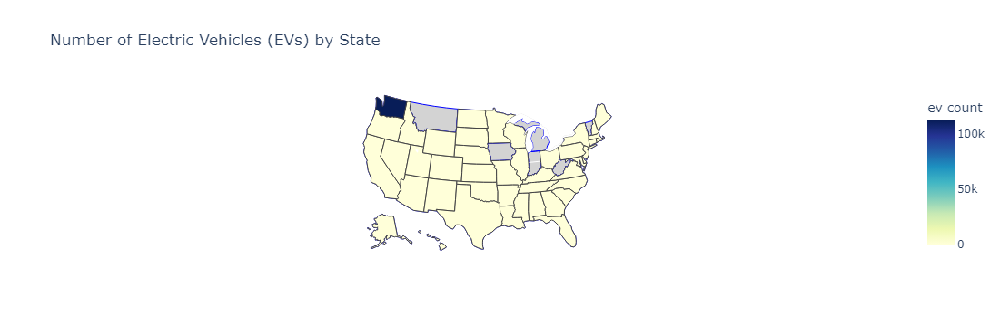

In [72]:
# creating choropleth
fig = px.choropleth(
    df_choropleth,
    locations="state",
    color="ev count",
    scope="usa",
    color_continuous_scale="YlGnBu",  # Changed to 'YlGnBu'
    hover_name="state",  # Display state name on hover
    locationmode='USA-states',
    labels={'EV Count': 'Number of EVs'},
    title='Number of Electric Vehicles (EVs) by State',
    template='plotly_white'  # Optional: Change the background template
)

# Update layout for better visibility
fig.update_layout(
    geo=dict(
        scope='usa',
        showland=True,  # Show land areas
        landcolor='lightgrey',  # Color for land
        subunitcolor='blue',  # Color for state boundaries
        countrycolor='black',  # Color for country boundaries
        lataxis=dict(showgrid=True, gridcolor='white'),  # Latitude gridlines
        lonaxis=dict(showgrid=True, gridcolor='white')  # Longitude gridlines
    )
)

fig.show()

In [73]:
! pip install -U kaleido

In [74]:
# Save as interactive HTML
fig.write_html("choropleth_map.html")

******Creating a Racing Bar Plot to display the animation of EV Make and its count each year.******

In [76]:
# installing bar_chart_race
! pip install bar_chart_race

In [77]:
# importing neccessary libraries
import bar_chart_race as bcr

In [78]:
# defining df_racingbarplot
df_racingbarplot = df.groupby(["model year", "make"]).size().reset_index(name="ev count")
df_racingbarplot_pivot = df_racingbarplot.pivot(index="model year", columns="make", values="ev count").fillna(0)

In [79]:
# checking head
df_racingbarplot.head()

,model year,make,ev count
0,1997,CHEVROLET,1
1,1998,FORD,1
2,1999,FORD,3
3,2000,FORD,10
4,2002,TOYOTA,2


In [81]:
# checking heads
df_racingbarplot_pivot.head()

make,AUDI,AZURE DYNAMICS,BENTLEY,BMW,CADILLAC,CHEVROLET,CHRYSLER,FIAT,FISKER,FORD,...,POLESTAR,PORSCHE,RIVIAN,SMART,SUBARU,TESLA,TH!NK,TOYOTA,VOLKSWAGEN,VOLVO
model year,,,,,,,,,,,,,,,,,,,,,
1997,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1999,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0


In [85]:
# Create the bar chart race
bcr.bar_chart_race(
    df=df_racingbarplot_pivot,
    filename='racing-bar-plot-ev.gif',
    orientation='h',
    sort='desc',
    n_bars=10,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=20,
    interpolate_period=False,
    period_length=1250,
    title="Growth of EV Makes Over The Years",
    bar_size=0.95,
    cmap='dark12',
    filter_column_colors=True
)

MovieWriter imagemagick unavailable; using Pillow instead.


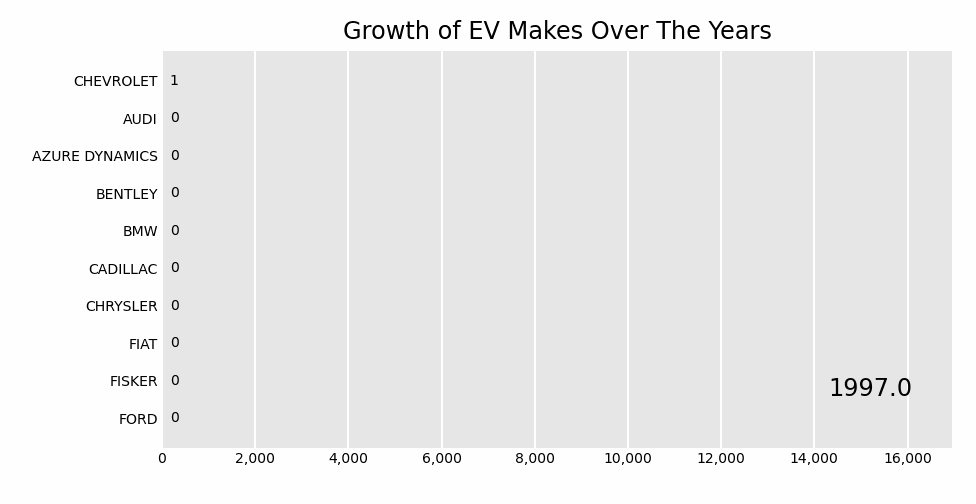

In [86]:
from IPython.display import Image

# Display the video file
Image(filename='racing-bar-plot-ev.gif')

In [91]:
# Create the bar chart race
bcr.bar_chart_race(
    df=df_racingbarplot_pivot,
    filename='racing-bar-plot-ev.mp4',
    orientation='h',
    sort='desc',
    n_bars=10,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=20,
    interpolate_period=False,
    period_length=1250,
    title="Growth of EV Makes Over The Years",
    bar_size=0.95,
    cmap='dark12',
    filter_column_colors=True
)

In [92]:
from IPython.display import Video

# Display the video file
Video(filename='racing-bar-plot-ev.mp4', embed=True)